In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!pip install shap
!pip install torch==1.9.1
!pip install torchvision==0.10.1

ERROR: Could not find a version that satisfies the requirement torch==1.9.1 (from versions: 1.11.0, 1.12.0, 1.12.1, 1.13.0, 1.13.1, 2.0.0, 2.0.1, 2.1.0, 2.1.1, 2.1.2, 2.2.0)
ERROR: No matching distribution found for torch==1.9.1
ERROR: Could not find a version that satisfies the requirement torchvision==0.10.1 (from versions: 0.1.6, 0.1.7, 0.1.8, 0.1.9, 0.2.0, 0.2.1, 0.2.2, 0.2.2.post2, 0.2.2.post3, 0.12.0, 0.13.0, 0.13.1, 0.14.0, 0.14.1, 0.15.0, 0.15.1, 0.15.2, 0.16.0, 0.16.1, 0.16.2, 0.17.0)
ERROR: No matching distribution found for torchvision==0.10.1


In [5]:
import zipfile
# Ruta del archivo ZIP que deseas descomprimir en Google Drive
ruta_zip = '/content/drive/MyDrive/HOJAS/Hojas-20240131T050046Z-001.zip'  # Cambia esta ruta por la de tu archivo ZIP

# Ruta de la carpeta donde deseas extraer los archivos
ruta_destino = '/content/descomprimido/'  # Cambia esta ruta según tus preferencias

# Descomprimir el archivo ZIP
with zipfile.ZipFile(ruta_zip, 'r') as archivo_zip:
    archivo_zip.extractall(ruta_destino)

sdsadasdasd

In [6]:
import torch
import torchvision.transforms as transforms
from torchvision.models import inception_v3, Inception_V3_Weights
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import torch.optim as optim
import torch.nn as nn
import matplotlib.pyplot as plt

# Configuración del dispositivo para usar CUDA si está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Definición de transformaciones para las imágenes
transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Función para cargar datos
def load_data(train_directory, test_directory):
    datasets = {
        "train": ImageFolder(root=train_directory, transform=transform),
        "test": ImageFolder(root=test_directory, transform=transform)
    }
    dataloaders = {
        x: DataLoader(datasets[x], batch_size=32, shuffle=True) for x in ['train', 'test']
    }
    return dataloaders

# Cargar y preparar el modelo InceptionV3
def prepare_model(num_classes):
    weights = Inception_V3_Weights.IMAGENET1K_V1
    model = inception_v3(weights=weights, aux_logits=True)
    model.fc = nn.Linear(model.fc.in_features, num_classes)
    model.AuxLogits.fc = nn.Linear(model.AuxLogits.fc.in_features, num_classes)
    return model.to(device)

# Entrenamiento del modelo
# Entrenamiento del modelo
# Entrenamiento del modelo
def train_and_evaluate_model(model, dataloaders, epochs=5):
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    criterion = nn.CrossEntropyLoss()

    # Listas para guardar los valores de pérdida y precisión
    train_losses, test_losses = [], []
    train_accuracies, test_accuracies = [], []

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = total = 0

        for inputs, labels in dataloaders['train']:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            if isinstance(outputs, tuple):  # Si hay salidas auxiliares, usa solo la principal
                outputs = outputs[0]
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        train_losses.append(running_loss / len(dataloaders['train']))
        train_accuracies.append(100 * correct / total)

        # Evaluación
        model.eval()
        test_loss = 0.0
        correct = total = 0
        with torch.no_grad():
            for inputs, labels in dataloaders['test']:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                if isinstance(outputs, tuple):  # Si hay salidas auxiliares, usa solo la principal
                    outputs = outputs[0]
                loss = criterion(outputs, labels)
                test_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        test_losses.append(test_loss / len(dataloaders['test']))
        test_accuracies.append(100 * correct / total)

        print(f'Epoch {epoch+1}/{epochs}, Train Loss: {train_losses[-1]:.4f}, Test Loss: {test_losses[-1]:.4f}, '
              f'Train Accuracy: {train_accuracies[-1]:.2f}%, Test Accuracy: {test_accuracies[-1]:.2f}%')

    return train_losses, test_losses, train_accuracies, test_accuracies

    # Gráfica de pérdidas
# Directorios de entrenamiento y validación (actualiza estas rutas según tu configuración)
# Directorios de entrenamiento y validación
train_directory = '/content/descomprimido/Hojas/Train'
test_directory = '/content/descomprimido/Hojas/Test'


# Cargar datos de entrenamiento y validación
dataloaders = load_data(train_directory, test_directory)

# Definir el número de clases
num_classes = 3  # Ajusta esto según tu conjunto de datos específico

# Preparar y entrenar el modelo
model = prepare_model(num_classes)
train_and_evaluate_model(model, dataloaders, epochs=5)





Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:02<00:00, 38.7MB/s]


Epoch 1/5, Train Loss: 0.1730, Test Loss: 0.2038, Train Accuracy: 93.88%, Test Accuracy: 95.64%
Epoch 2/5, Train Loss: 0.0820, Test Loss: 0.0616, Train Accuracy: 98.06%, Test Accuracy: 99.03%
Epoch 3/5, Train Loss: 0.0315, Test Loss: 0.0048, Train Accuracy: 99.15%, Test Accuracy: 99.76%
Epoch 4/5, Train Loss: 0.0401, Test Loss: 0.1093, Train Accuracy: 98.48%, Test Accuracy: 94.19%
Epoch 5/5, Train Loss: 0.0335, Test Loss: 0.0045, Train Accuracy: 98.97%, Test Accuracy: 100.00%


([0.172990364481498,
  0.08197287418834794,
  0.031544025471353404,
  0.04012531307055794,
  0.03346727297712977],
 [0.20376347119991595,
  0.061626240897637144,
  0.0048412962149506295,
  0.10928029624315408,
  0.004548815271566407],
 [93.87507580351728,
  98.05942995755004,
  99.15100060642814,
  98.48392965433597,
  98.96907216494846],
 [95.64164648910412,
  99.0314769975787,
  99.75786924939467,
  94.18886198547216,
  100.0])

Epoch 1/5, Train Loss: 0.0480, Test Loss: 0.0374, Train Accuracy: 98.61%, Test Accuracy: 99.03%
Epoch 2/5, Train Loss: 0.0251, Test Loss: 0.0072, Train Accuracy: 99.27%, Test Accuracy: 99.52%
Epoch 3/5, Train Loss: 0.0090, Test Loss: 0.0045, Train Accuracy: 99.70%, Test Accuracy: 99.76%
Epoch 4/5, Train Loss: 0.0309, Test Loss: 0.0257, Train Accuracy: 99.03%, Test Accuracy: 98.79%
Epoch 5/5, Train Loss: 0.0428, Test Loss: 0.0149, Train Accuracy: 98.97%, Test Accuracy: 99.52%


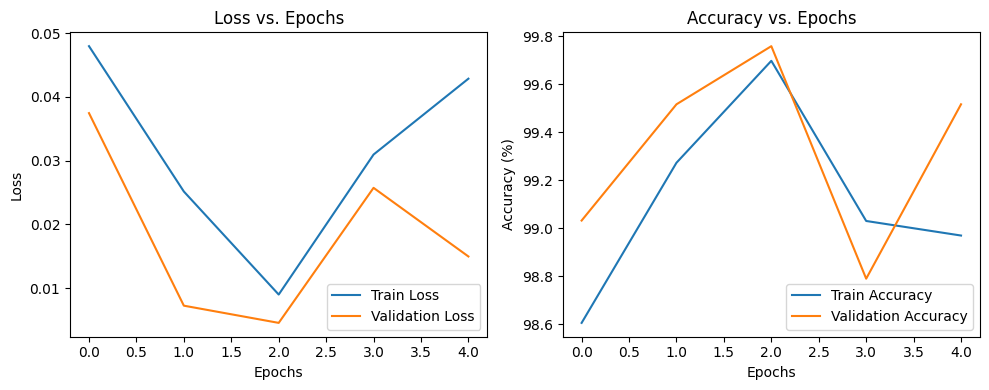

In [7]:
import matplotlib.pyplot as plt

# Ejecutar entrenamiento y evaluación
train_losses, test_losses, train_accuracies, test_accuracies = train_and_evaluate_model(model, dataloaders, epochs=5)

# Graficar pérdidas
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Validation Loss')
plt.title('Loss vs. Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Graficar precisión
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(test_accuracies, label='Validation Accuracy')
plt.title('Accuracy vs. Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.legend()

plt.tight_layout()
plt.show()


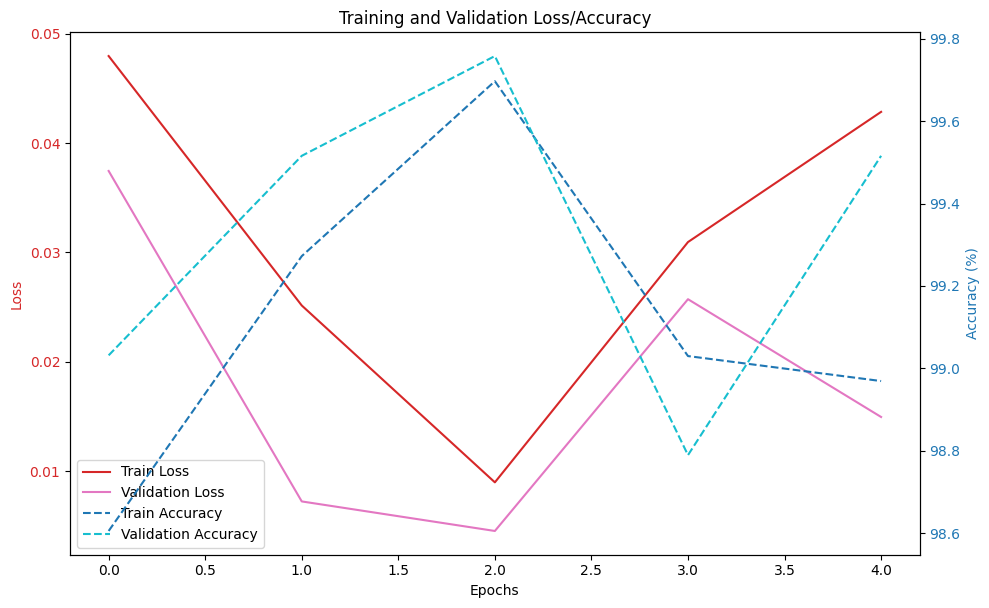

In [8]:
import matplotlib.pyplot as plt

# Suponiendo que ya tienes train_losses, test_losses, train_accuracies, test_accuracies
# gracias a la ejecución de train_and_evaluate_model(model, dataloaders, epochs=5)

fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:red'
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss', color=color)
lns1 = ax1.plot(train_losses, label='Train Loss', color=color)
lns2 = ax1.plot(test_losses, label='Validation Loss', color='tab:pink')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # Instanciar un segundo eje Y que comparte el mismo eje X
color = 'tab:blue'
ax2.set_ylabel('Accuracy (%)', color=color)  # we already handled the x-label with ax1
lns3 = ax2.plot(train_accuracies, label='Train Accuracy', color=color, linestyle='--')
lns4 = ax2.plot(test_accuracies, label='Validation Accuracy', color='tab:cyan', linestyle='--')
ax2.tick_params(axis='y', labelcolor=color)

# Combinar leyendas de los dos ejes
lns = lns1+lns2+lns3+lns4
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc=0)

fig.tight_layout()  # para asegurar un buen layout
plt.title('Training and Validation Loss/Accuracy')
plt.show()


In [9]:
!pip install shap

<Figure size 640x480 with 0 Axes>

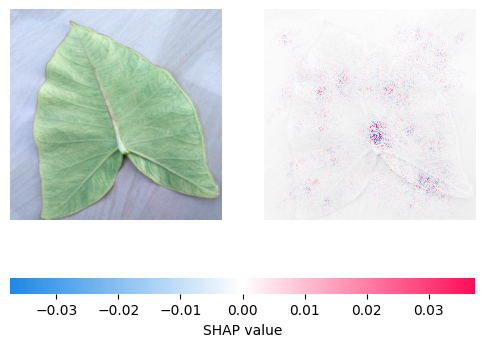

La etiqueta de la clase predicha es: M


In [10]:
import numpy as np
import shap
# Análisis SHAP
background, _ = next(iter(dataloaders['train']))
background = background.to(device)
e = shap.GradientExplainer(model, background)
test_images, test_labels = next(iter(dataloaders['test']))
test_images = test_images.to(device)
shap_values = e.shap_values(test_images[:1])
output = model(test_images[:1])
predicted_class = output.max(1)[1].item()
shap_values_for_plotting = shap_values[predicted_class][0]
shap_values_for_plotting = shap_values_for_plotting.transpose(1, 2, 0)
test_image_for_plotting = test_images[0].cpu().numpy()
test_image_for_plotting = test_image_for_plotting.transpose(1, 2, 0)
test_image_for_plotting = (test_image_for_plotting - test_image_for_plotting.min()) / (test_image_for_plotting.max() - test_image_for_plotting.min())
plt.figure()
shap.image_plot(shap_values_for_plotting[np.newaxis, :], test_image_for_plotting[np.newaxis, :])
plt.show()
class_labels = {0: "H", 1: "L",2:'M'}  # Define según tu conjunto de datos
print("La etiqueta de la clase predicha es:", class_labels[predicted_class])


<Figure size 640x480 with 0 Axes>

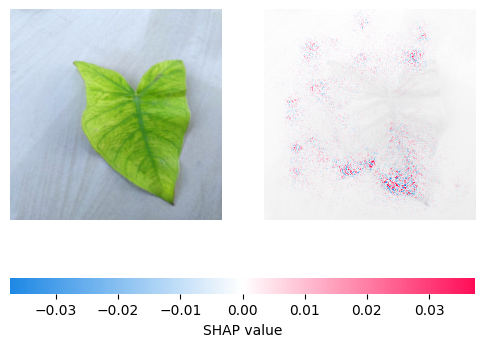

Imagen 1: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

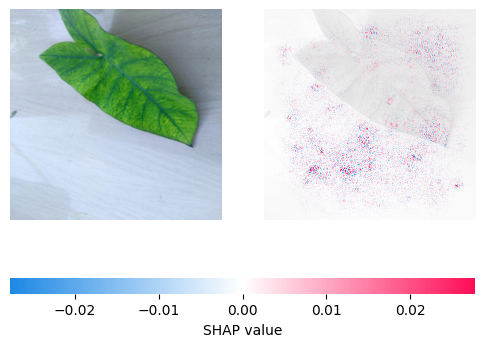

Imagen 2: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

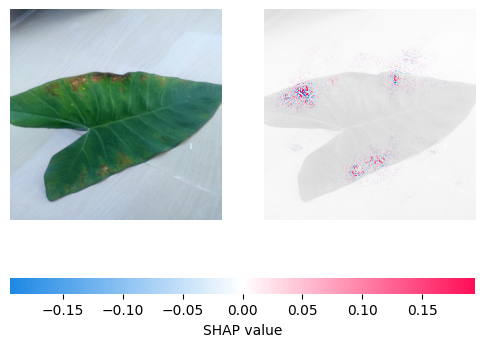

Imagen 3: La etiqueta de la clase predicha es: L


<Figure size 640x480 with 0 Axes>

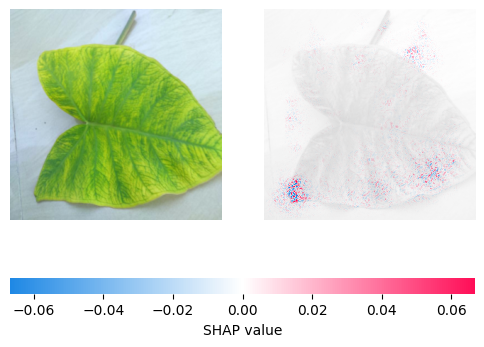

Imagen 4: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

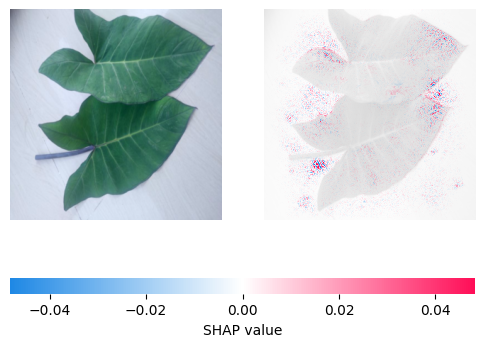

Imagen 5: La etiqueta de la clase predicha es: H


<Figure size 640x480 with 0 Axes>

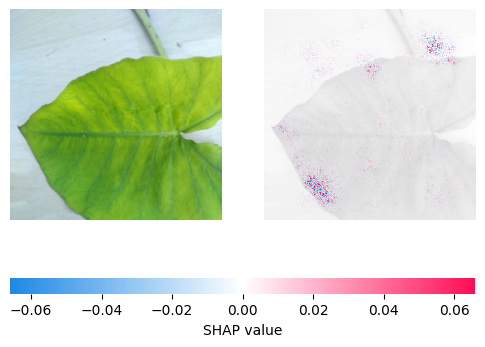

Imagen 6: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

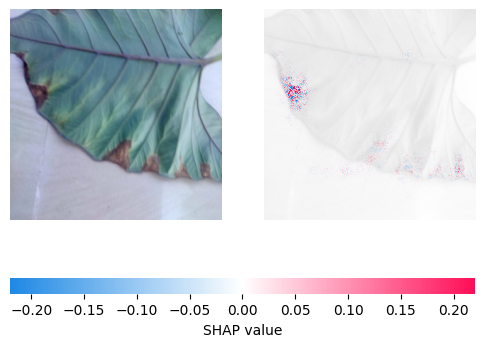

Imagen 7: La etiqueta de la clase predicha es: L


<Figure size 640x480 with 0 Axes>

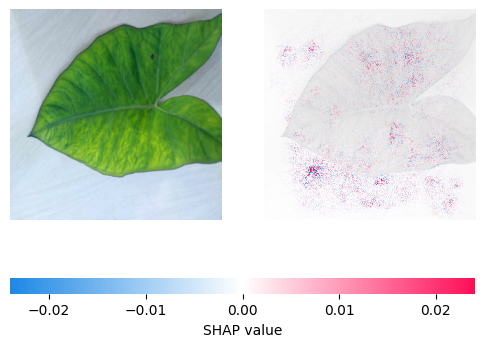

Imagen 8: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

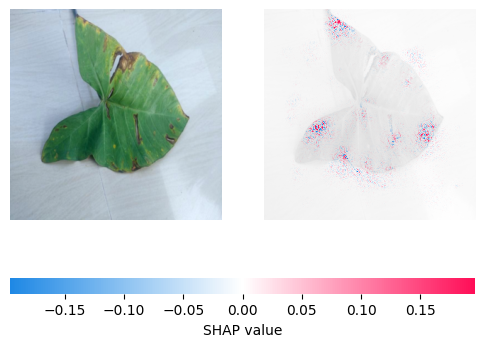

Imagen 9: La etiqueta de la clase predicha es: L


<Figure size 640x480 with 0 Axes>

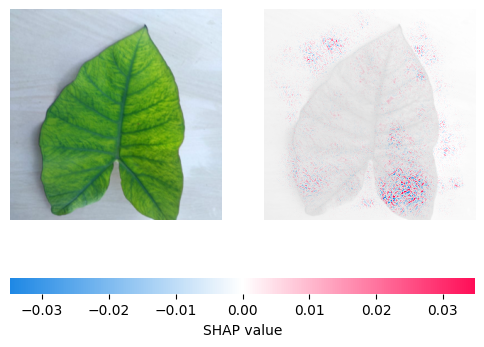

Imagen 10: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

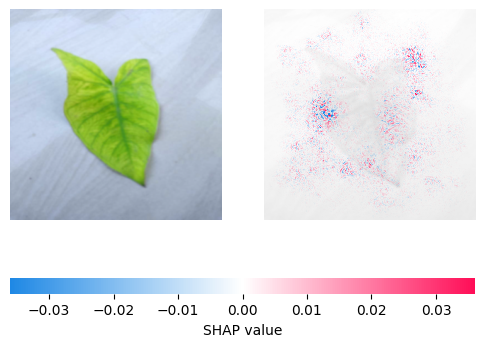

Imagen 11: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

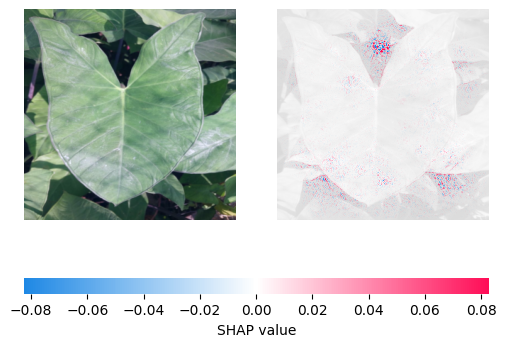

Imagen 12: La etiqueta de la clase predicha es: H


<Figure size 640x480 with 0 Axes>

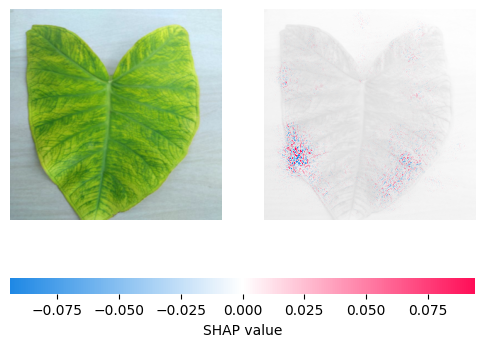

Imagen 13: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

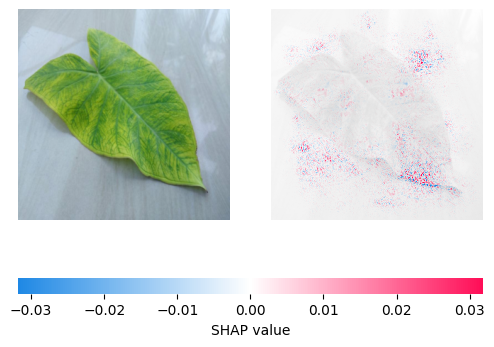

Imagen 14: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

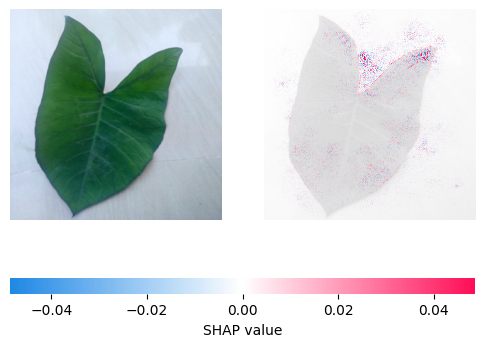

Imagen 15: La etiqueta de la clase predicha es: H


<Figure size 640x480 with 0 Axes>

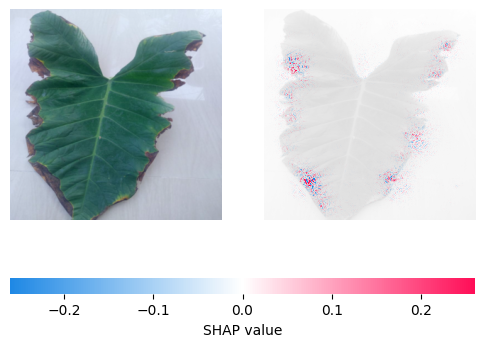

Imagen 16: La etiqueta de la clase predicha es: L


<Figure size 640x480 with 0 Axes>

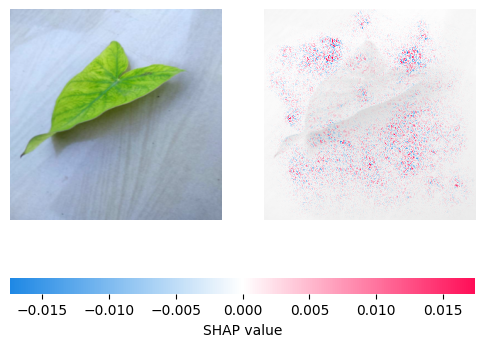

Imagen 17: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

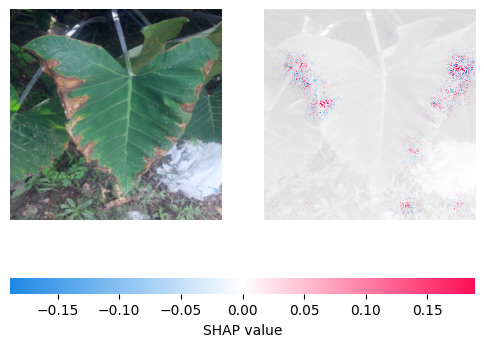

Imagen 18: La etiqueta de la clase predicha es: L


<Figure size 640x480 with 0 Axes>

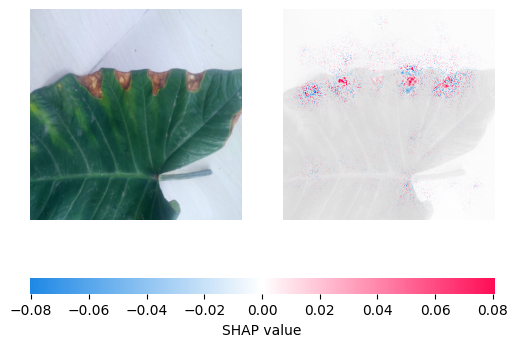

Imagen 19: La etiqueta de la clase predicha es: L


<Figure size 640x480 with 0 Axes>

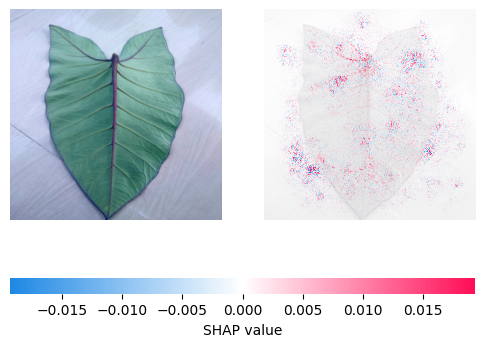

Imagen 20: La etiqueta de la clase predicha es: H


<Figure size 640x480 with 0 Axes>

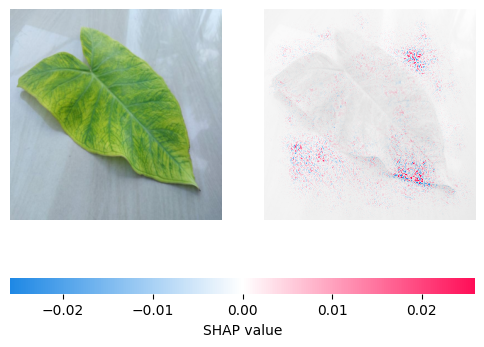

Imagen 21: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

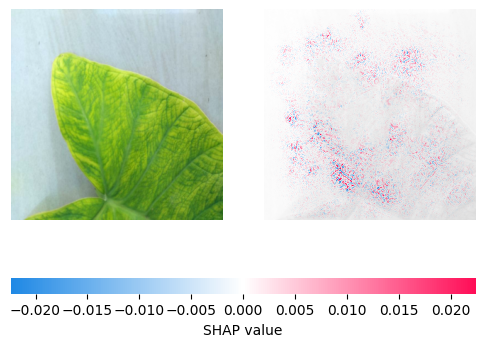

Imagen 22: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

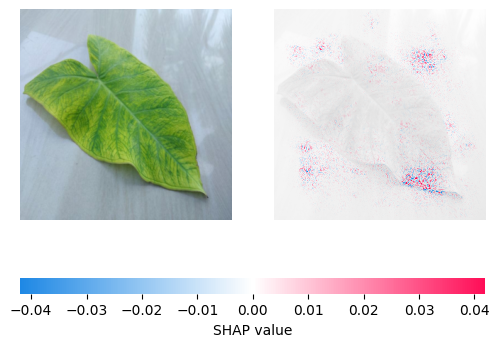

Imagen 23: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

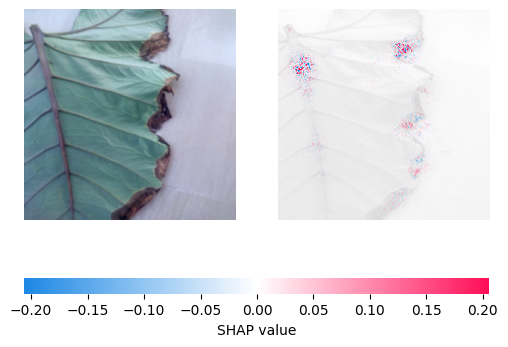

Imagen 24: La etiqueta de la clase predicha es: L


<Figure size 640x480 with 0 Axes>

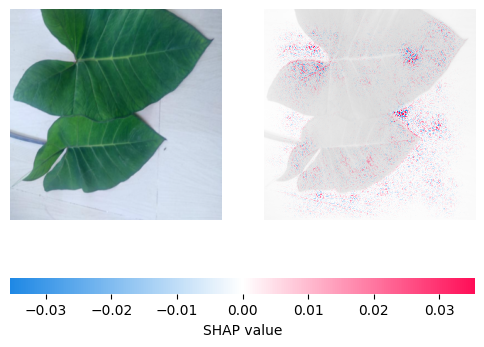

Imagen 25: La etiqueta de la clase predicha es: H


<Figure size 640x480 with 0 Axes>

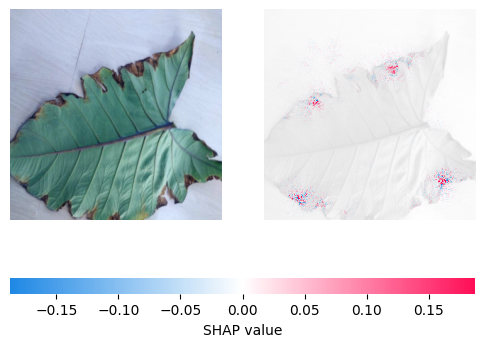

Imagen 26: La etiqueta de la clase predicha es: L


<Figure size 640x480 with 0 Axes>

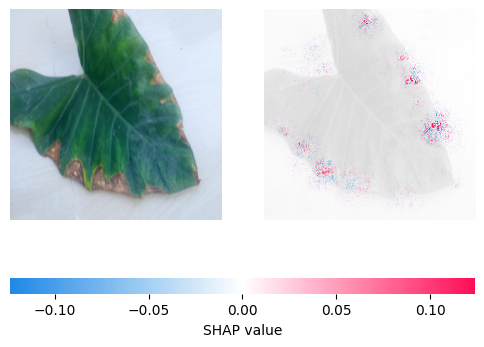

Imagen 27: La etiqueta de la clase predicha es: L


<Figure size 640x480 with 0 Axes>

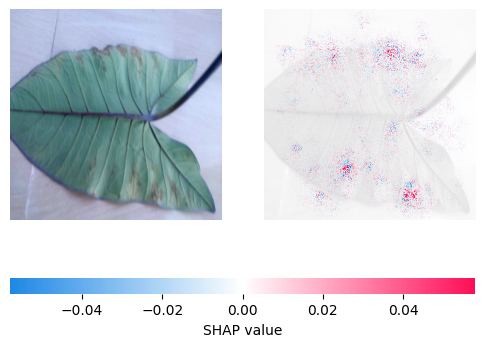

Imagen 28: La etiqueta de la clase predicha es: L


<Figure size 640x480 with 0 Axes>

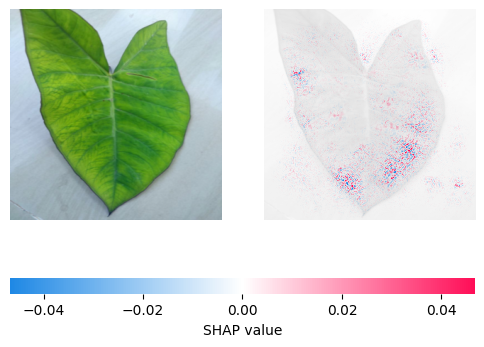

Imagen 29: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

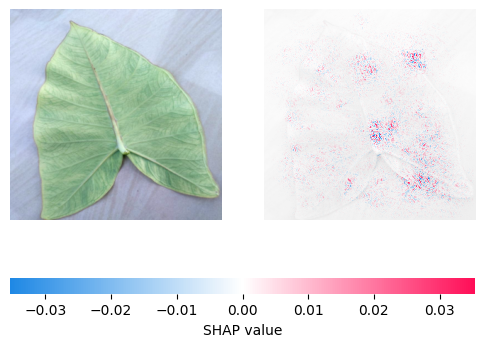

Imagen 30: La etiqueta de la clase predicha es: M


In [11]:
import matplotlib.pyplot as plt

# Asumiendo que 'dataloaders', 'model', 'device' están definidos previamente
# Asumiendo también que 'class_labels' está definido como mostraste

# Preparar el explicador SHAP con un conjunto de fondo
background, _ = next(iter(dataloaders['train']))
background = background.to(device)
e = shap.GradientExplainer(model, background)

# Obtener imágenes de prueba y sus etiquetas
test_images, test_labels = next(iter(dataloaders['test']))
test_images = test_images.to(device)

# Procesar las primeras 10 imágenes
for i in range(30):
    shap_values = e.shap_values(test_images[i:i+1])
    output = model(test_images[i:i+1])
    predicted_class = output.max(1)[1].item()
    shap_values_for_plotting = shap_values[predicted_class][0].transpose(1, 2, 0)

    # Normalizar la imagen para la visualización
    test_image_for_plotting = test_images[i].cpu().numpy().transpose(1, 2, 0)
    test_image_for_plotting = (test_image_for_plotting - test_image_for_plotting.min()) / (test_image_for_plotting.max() - test_image_for_plotting.min())

    # Mostrar la imagen y su explicación SHAP
    plt.figure()
    shap.image_plot(shap_values_for_plotting[np.newaxis, :], test_image_for_plotting[np.newaxis, :])

    # Imprimir la etiqueta de la clase predicha
    print(f"Imagen {i+1}: La etiqueta de la clase predicha es: {class_labels[predicted_class]}")


<Figure size 640x480 with 0 Axes>

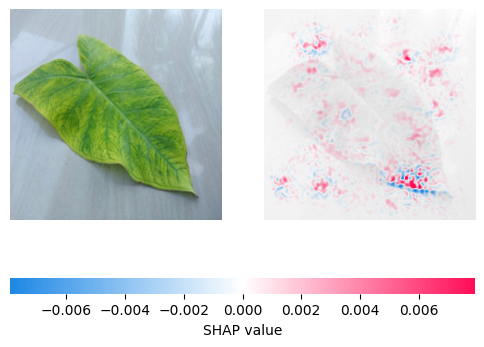

Imagen 1: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

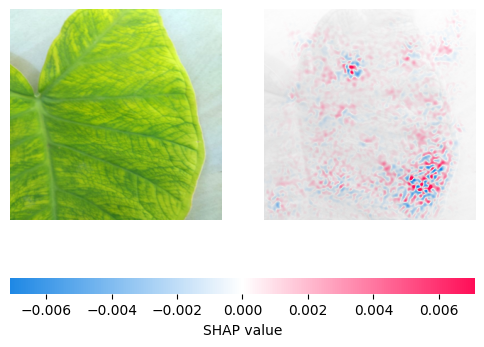

Imagen 2: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

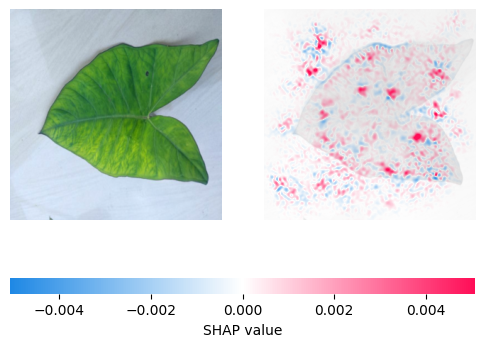

Imagen 3: La etiqueta de la clase predicha es: M


<Figure size 640x480 with 0 Axes>

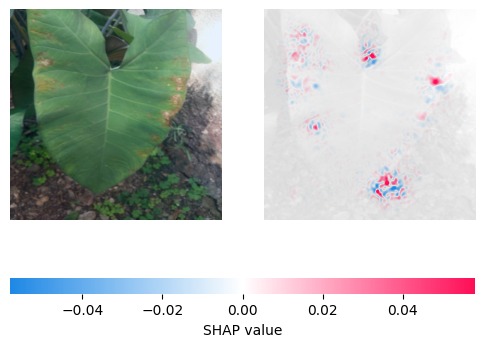

Imagen 4: La etiqueta de la clase predicha es: L


KeyboardInterrupt: 

In [12]:
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# Asumiendo que 'dataloaders', 'model', 'device', 'class_labels' están definidos previamente

# Preparar el explicador SHAP con un conjunto de fondo
background, _ = next(iter(dataloaders['train']))
background = background.to(device)
e = shap.GradientExplainer(model, background)

# Obtener imágenes de prueba y sus etiquetas
test_images, test_labels = next(iter(dataloaders['test']))
test_images = test_images.to(device)

# Procesar las primeras 3 imágenes (cambié a 3 para ser coherente con tu último ejemplo)
for i in range(20):
    shap_values = e.shap_values(test_images[i:i+1])
    output = model(test_images[i:i+1])
    predicted_class = output.max(1)[1].item()
    shap_values_for_plotting = shap_values[predicted_class][0].transpose(1, 2, 0)

    # Aplicar filtro gaussiano solo a los valores SHAP para suavizarlos
    shap_values_for_plotting = gaussian_filter(shap_values_for_plotting, sigma=2)  # Ajusta el sigma según necesidad para difuminar los valores SHAP

    # Normalizar la imagen para la visualización
    test_image_for_plotting = test_images[i].cpu().numpy().transpose(1, 2, 0)
    test_image_for_plotting = (test_image_for_plotting - test_image_for_plotting.min()) / (test_image_for_plotting.max() - test_image_for_plotting.min())

    # Mostrar la imagen y su explicación SHAP
    plt.figure()
    shap.image_plot(shap_values_for_plotting[np.newaxis, :], test_image_for_plotting[np.newaxis, :])

    # Imprimir la etiqueta de la clase predicha
    print(f"Imagen {i+1}: La etiqueta de la clase predicha es: {class_labels[predicted_class]}")


In [15]:
!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 1.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 6.0 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86832 sha256=46e0fbf6a773081b057f493441d19d354edb4a26b8266433c368f8f280f156d1
  Stored in directory: /root/.cache/pip/wheels/3a/70/07/428d2b58660a1a3b431db59b806a10da736612ebbc66c1bcc5
Successfully built umap-learn


In [ ]:
import numpy as np
from sklearn.decomposition import PCA

# Inicializa una lista para almacenar los valores SHAP acumulados
shap_values_accumulated = []

# Procesar un conjunto de imágenes
for i in range(20):  # Ajusta según la capacidad de tu sistema
    # Calcula los valores SHAP para la imagen actual
    shap_values = e.shap_values(test_images[i:i+1])

    # Acumula los valores SHAP para una clase específica, por ejemplo, la clase predicha
    output = model(test_images[i:i+1])
    predicted_class = output.max(1)[1].item()
    # Asegurarse de que la conversión a NumPy se hace correctamente sin llamar a .cpu() en objetos que ya son arreglos de NumPy
    shap_values_accumulated.append(shap_values[predicted_class][0].reshape(-1))  # Directamente reshape y acumular

# Convertir la lista acumulada en un array de NumPy
shap_values_accumulated = np.array(shap_values_accumulated)
# Inicializar y ajustar PCA
pca = PCA(n_components=3)
shap_values_pca = pca.fit_transform(shap_values_accumulated)

# Visualizar los resultados de PCA
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Asignar un color a cada clase, puedes ajustar esto según tus etiquetas
colors = ['r', 'g', 'b']
for i in range(shap_values_pca.shape[0]):
    ax.scatter(shap_values_pca[i, 0], shap_values_pca[i, 1], shap_values_pca[i, 2], color=colors[predicted_class], alpha=0.5)

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
plt.title('PCA of SHAP Values')
plt.show()


In [ ]:
import umap
import numpy as np
import matplotlib.pyplot as plt

# Suponiendo que shap_values_accumulated ya contiene tus valores SHAP acumulados

# Inicializar y ajustar UMAP
reducer = umap.UMAP(n_components=2, random_state=42)
shap_values_umap = reducer.fit_transform(shap_values_accumulated)

# Visualizar los resultados de UMAP en 2D
plt.figure(figsize=(10, 7))

# Asignar un color a cada clase, puedes ajustar esto según tus etiquetas
# Aquí, asumimos que 'predicted_class' es la clase predicha para la última imagen procesada
# Para una visualización más precisa, considera usar un arreglo con las clases reales o predichas para todas las imágenes procesadas
colors = ['r', 'g', 'b']
color_map = [colors[predicted_class] for i in range(len(shap_values_umap))]

plt.scatter(shap_values_umap[:, 0], shap_values_umap[:, 1], c=color_map, alpha=0.5)
plt.title('UMAP of SHAP Values')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.colorbar()
plt.show()


In [35]:
shap_values_concatenated.shape

(32, 9, 299, 299)

In [13]:

import shap
import torch
import numpy as np
from sklearn.decomposition import PCA
# Asegúrate de que 'model' y 'dataloaders' estén definidos como se muestra en tu pregunta

# Obtener imágenes de prueba y sus etiquetas
test_images, test_labels = next(iter(dataloaders['test']))
test_images = test_images.to(device)

# Calcular los SHAP values
# Esto puede tomar tiempo dependiendo del tamaño de tu conjunto de datos de prueba y la complejidad del modelo
shap_values = e.shap_values(test_images)

# Concatenar los SHAP values para todas las clases, asumiendo un enfoque multiclase
shap_values_concatenated = np.concatenate([shap_values[i] for i in range(len(shap_values))], axis=1)

# Aplicar PCA para reducir la dimensionalidad
pca = PCA(n_components=2)  # Ajusta este valor según tus necesidades
shap_values_pca = pca.fit_transform(shap_values_concatenated.reshape(shap_values_concatenated.shape[0], -1))

# shap_values_pca ahora contiene tus SHAP values reducidos listos para ser utilizados en clustering


In [14]:
shap_values_pca

array([[-0.13790398, -0.09938895],
       [-0.37903923, -0.20026136],
       [-0.19472216, -1.24895651],
       [-0.20508581, -0.16536642],
       [-0.16721917, -0.05923079],
       [-0.13741993, -0.13175114],
       [-0.13563193, -0.13265685],
       [-0.18436758, -0.05926243],
       [-0.13061219, -0.09035195],
       [-0.13449417, -0.13559206],
       [-0.14114728, -0.12757277],
       [-0.12429122, -0.51781278],
       [-0.12776608, -0.09544968],
       [-0.13199822, -0.13860601],
       [-0.11070961, -0.05461552],
       [-0.16265853, -0.05870018],
       [-0.24478598, -0.2732809 ],
       [ 6.19523428,  0.4828152 ],
       [-0.15440204, -0.094056  ],
       [-0.12236572, -0.12156483],
       [-0.13264177, -0.23620928],
       [-0.13168518, -0.13262656],
       [-0.2073388 , -0.17602614],
       [-0.12622098, -0.09346577],
       [-0.14473177, -0.09281867],
       [-0.13815952, -0.11143157],
       [-0.67222792, -0.7292819 ],
       [-0.26995229, -0.42703705],
       [-0.16733352,

In [22]:
import os
import pandas as pd
from umap import UMAP

# Supongamos que estas funciones y variables ya están definidas
# embeddings, labels = extract_embeddings(dataloaders, model)


# Crear un DataFrame con los embeddings de UMAP
df_umap = pd.DataFrame(shap_values_pca, columns=['umap_x', 'umap_y'])
df_umap['label'] = test_labels  # Asumiendo que labels es un array de numpy

# Mapeo de etiquetas numéricas a nombres de subcarpetas
label_to_folder = {
    0: 'Healthy',
    1: 'Leaf Blight',
    2: 'Mosaic'
}

test_directory = '/content/descomprimido/Hojas/Test'
image_paths = []
used_images = set()  # Para rastrear las imágenes ya utilizadas

# Buscar imágenes correspondientes a cada etiqueta sin repetir
for index, row in df_umap.iterrows():
    label = row['label']
    folder_name = label_to_folder[label]
    subfolder = os.path.join(test_directory, folder_name)
    image_found = False
    for dirname, _, filenames in os.walk(subfolder):
        for filename in filenames:
            image_path = os.path.join(dirname, filename)
            if filename.endswith('.jpg') and image_path not in used_images:
                image_paths.append(image_path)
                used_images.add(image_path)
                image_found = True
                break
        if image_found:
            break

# Verificar si hemos encontrado una imagen para cada punto
if len(image_paths) != len(df_umap):
    print(f"Se encontraron {len(image_paths)} imágenes, pero hay {len(df_umap)} puntos UMAP.")
    # Manejar la situación como se prefiera, por ejemplo, asignando imágenes predeterminadas para los faltantes

# Añadir rutas de imágenes al DataFrame
df_umap['image_path'] = image_paths  # Asegurarse de que la longitud coincida


In [24]:
test_labels

tensor([0, 1, 1, 1, 2, 2, 0, 2, 2, 0, 0, 1, 2, 0, 2, 2, 1, 1, 2, 2, 2, 1, 1, 0,
        2, 2, 1, 1, 1, 1, 2, 0])

In [28]:
df_umap

,umap_x,umap_y,label,image_path,image_base64
0,-0.137904,-0.099389,0,/content/descomprimido/Hojas/Test/Healthy/Colo...,"data:image/png;base64,/9j/4AAQSkZJRgABAQEASABI..."
1,-0.379039,-0.200261,1,/content/descomprimido/Hojas/Test/Leaf Blight/...,"data:image/png;base64,/9j/4AAQSkZJRgABAQEASABI..."
2,-0.194722,-1.248957,1,/content/descomprimido/Hojas/Test/Leaf Blight/...,"data:image/png;base64,/9j/4AAQSkZJRgABAQEASABI..."
3,-0.205086,-0.165366,1,/content/descomprimido/Hojas/Test/Leaf Blight/...,"data:image/png;base64,/9j/4AAQSkZJRgABAQEASABI..."
4,-0.167219,-0.059231,2,/content/descomprimido/Hojas/Test/Mosaic/Coloc...,"data:image/png;base64,/9j/4AAQSkZJRgABAQEASABI..."
5,-0.137420,-0.131751,2,/content/descomprimido/Hojas/Test/Mosaic/Coloc...,"data:image/png;base64,/9j/4AAQSkZJRgABAQEASABI..."
6,-0.135632,-0.132657,0,/content/descomprimido/Hojas/Test/Healthy/Colo...,"data:image/png;base64,/9j/4AAQSkZJRgABAQEASABI..."
7,-0.184368,-0.059262,2,/content/descomprimido/Hojas/Test/Mosaic/Coloc...,"data:image/png;base64,/9j/4AAQSkZJRgABAQEASABI..."
8,-0.130612,-0.090352,2,/content/descomprimido/Hojas/Test/Mosaic/Coloc...,"data:image/png;base64,/9j/4AAQSkZJRgABAQEASABI..."
9,-0.134494,-0.135592,0,/content/descomprimido/Hojas/Test/Healthy/Colo...,"data:image/png;base64,/9j/4AAQSkZJRgABAQEASABI..."


In [29]:
import os
import pandas as pd
from umap import UMAP
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource
from bokeh.transform import factor_cmap
from bokeh.palettes import Spectral10
from PIL import Image
import base64
from io import BytesIO
import numpy as np
from bokeh.plotting import figure, output_file, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource
from bokeh.transform import factor_cmap
from bokeh.palettes import Spectral10
import base64
from io import BytesIO
import numpy as np
import pandas as pd
from umap import UMAP
from PIL import Image


# Aplicar UMAP

output_file("visualizacion_umap.html")

# Crear un DataFrame con los embeddings de UMAP y las etiquetas
df_umap = pd.DataFrame(shap_values_pca, columns=['umap_x', 'umap_y'])
df_umap['label'] = test_labels.cpu().numpy()  # Convertir el tensor a un array de NumPy correctamente  # Asumiendo que labels es un array de numpy

# Función para codificar imágenes en base64 para su uso en Bokeh
def img_to_base64(path):
    with open(path, 'rb') as f:
        return 'data:image/png;base64,' + base64.b64encode(f.read()).decode()

# Asumiendo que ya has mapeado las rutas de las imágenes en `image_paths` como se muestra arriba
df_umap['image_path'] = image_paths[:len(df_umap)]  # Asegurarse de que la longitud coincida
df_umap['image_base64'] = df_umap['image_path'].apply(img_to_base64)

# Preparar los datos para Bokeh
source = ColumnDataSource(data={
    'x': df_umap['umap_x'],
    'y': df_umap['umap_y'],
    'img': df_umap['image_base64'],
    'label': [str(x) for x in df_umap['label']]
})

# Configuración de la herramienta de Hover para mostrar imágenes
hover = HoverTool()
hover.tooltips = """
    <div>
        <div>
            <!-- Ajusta los valores de width y height según necesites -->
            <img src="@img" alt="" width="500" height="500" style="float: center; margin: 0px 15px 15px 0px;" border="2"></img>
        </div>
    </div>
"""

# Crear la figura de Bokeh
p = figure(width=300, height=300, tools=[hover, "pan", "wheel_zoom", "box_zoom", "reset"])
p.circle('x', 'y', size=5, source=source, color=factor_cmap('label', palette=Spectral10, factors=[str(x) for x in range(len(np.unique(test_labels.cpu().numpy())))]))

# Mostrar la figura en el notebook y guardarla en un archivo HTML
output_notebook()  # Para visualización en el notebook, comenta esta línea si no la necesitas
show(p)  # Esto generará la visualización y la guardará automáticamente en el archivo HTML especificado
